In [4]:
#Importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#ignoring harmless warnings

import warnings
warnings.filterwarnings("ignore")

#set to display all the columns in dataset

pd.set_option("display.max_columns",None)

#To run sql queries on DataFrame

import pandasql as psql

In [5]:
#Reading the required csv file 
HRdata= pd.read_csv(r"C:\Users\Dlc\Downloads\archive\train.csv",header=0)
HRdata_bk=HRdata.copy()
HRdata.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [6]:
#printing the info of the HRdata file
HRdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [7]:
#checking whether the duplicates are present in the data set
HRdata_dup= HRdata[HRdata.duplicated(keep='last')]
HRdata_dup

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted


In [8]:
#no of null values prsent in the each column of data set
HRdata.isnull().sum()

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

In [9]:
#Filling the null(or)NaN values with forward fill
HRdata=HRdata.fillna(method='ffill')
HRdata

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,Bachelor's,m,sourcing,1,29,1.0,2,0,0,45,0


In [10]:
# Character variables department,region,education,gender,recruitment_channel to encode by using LabelEncoder
#categorical to numerical
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()

HRdata['department']=le.fit_transform(HRdata['department'])
HRdata['region']=le.fit_transform(HRdata['region'])
HRdata['education']=le.fit_transform(HRdata['education'])
HRdata['gender']=le.fit_transform(HRdata['gender'])
HRdata['recruitment_channel']=le.fit_transform(HRdata['recruitment_channel'])
HRdata.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,7,31,2,0,2,1,35,5.0,8,1,0,49,0
1,65141,4,14,0,1,0,1,30,5.0,4,0,0,60,0
2,7513,7,10,0,1,2,1,34,3.0,7,0,0,50,0
3,2542,7,15,0,1,0,2,39,1.0,10,0,0,50,0
4,48945,8,18,0,1,0,1,45,3.0,2,0,0,73,0


In [11]:
# Delete the variables whick are influencing the target variable

del HRdata['employee_id']

In [12]:
#Drops the null valued rows

HRdata=HRdata.dropna()

In [13]:
# Identify the independent variables
IndepVar=[]
for col in  HRdata.columns:
    if col!='is_promoted': 
        IndepVar.append(col) 
TargetVar='is_promoted' 
x=HRdata[IndepVar] 
y=HRdata[TargetVar] 

In [14]:
# Identify variables for scaling
cols1=['department','region','education','gender',
       'recruitment_channel','no_of_trainings','age','previous_year_rating',
       'length_of_service','KPIs_met >80%',
       'awards_won?','avg_training_score']


In [15]:
# Split the data into train and test (random sampling)

from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Display the shape for train & test data

x_train.shape, x_test.shape, y_train.shape, y_test.shape

((38365, 12), (16443, 12), (38365,), (16443,))

In [16]:
#scaling the features by using MinMaxScaler

from sklearn.preprocessing import MinMaxScaler

mmscaler = MinMaxScaler(feature_range=(0, 1))

x_train[cols1] = mmscaler.fit_transform(x_train[cols1])
x_train = pd.DataFrame(x_train)

x_test[cols1] = mmscaler.fit_transform(x_test[cols1])
x_test = pd.DataFrame(x_test)


In [17]:
#reading the required csv file

KNN_Results=pd.read_csv(r"C:\Users\Dlc\Downloads\KNN Algorithm files\KNN_Results.csv",header=0)

KNN_K_value =  1
Model Name: KNeighborsClassifier(n_neighbors=1)
Confusion matrix : 
 [[  404   929]
 [  923 14187]]
Outcome values : 
 404 929 923 14187
Classification report : 
               precision    recall  f1-score   support

           1       0.30      0.30      0.30      1333
           0       0.94      0.94      0.94     15110

    accuracy                           0.89     16443
   macro avg       0.62      0.62      0.62     16443
weighted avg       0.89      0.89      0.89     16443

Accuracy : 88.7 %
Precision : 30.4 %
Recall : 30.3 %
F1 Score : 0.304
Specificity or True Negative Rate : 93.9 %
Balanced Accuracy : 62.1 %
MCC : 0.242
roc_auc_score: 0.621


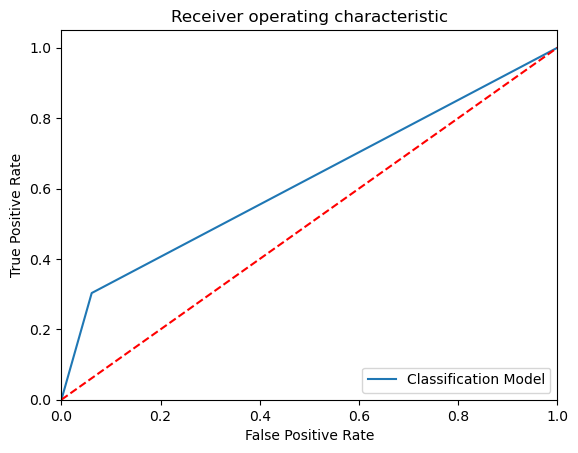

KNN_K_value =  2
Model Name: KNeighborsClassifier(n_neighbors=2)
Confusion matrix : 
 [[  189  1144]
 [  147 14963]]
Outcome values : 
 189 1144 147 14963
Classification report : 
               precision    recall  f1-score   support

           1       0.56      0.14      0.23      1333
           0       0.93      0.99      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.75      0.57      0.59     16443
weighted avg       0.90      0.92      0.90     16443

Accuracy : 92.1 %
Precision : 56.2 %
Recall : 14.2 %
F1 Score : 0.226
Specificity or True Negative Rate : 99.0 %
Balanced Accuracy : 56.6 %
MCC : 0.255
roc_auc_score: 0.566


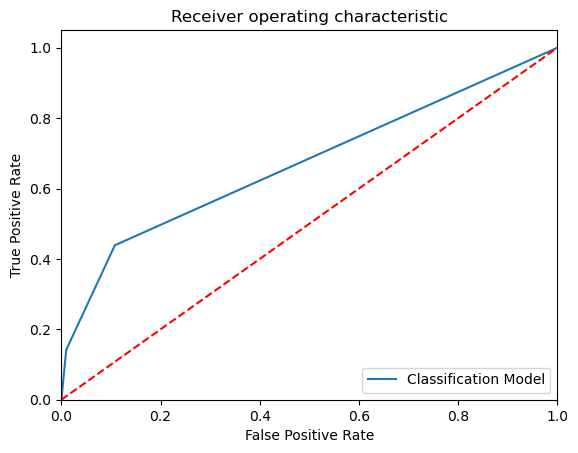

KNN_K_value =  3
Model Name: KNeighborsClassifier(n_neighbors=3)
Confusion matrix : 
 [[  298  1035]
 [  376 14734]]
Outcome values : 
 298 1035 376 14734
Classification report : 
               precision    recall  f1-score   support

           1       0.44      0.22      0.30      1333
           0       0.93      0.98      0.95     15110

    accuracy                           0.91     16443
   macro avg       0.69      0.60      0.63     16443
weighted avg       0.89      0.91      0.90     16443

Accuracy : 91.4 %
Precision : 44.2 %
Recall : 22.4 %
F1 Score : 0.297
Specificity or True Negative Rate : 97.5 %
Balanced Accuracy : 60.0 %
MCC : 0.273
roc_auc_score: 0.599


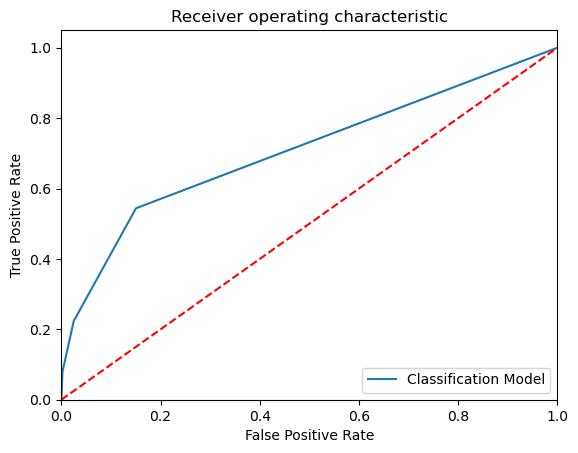

KNN_K_value =  4
Model Name: KNeighborsClassifier(n_neighbors=4)
Confusion matrix : 
 [[  176  1157]
 [  119 14991]]
Outcome values : 
 176 1157 119 14991
Classification report : 
               precision    recall  f1-score   support

           1       0.60      0.13      0.22      1333
           0       0.93      0.99      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.76      0.56      0.59     16443
weighted avg       0.90      0.92      0.90     16443

Accuracy : 92.2 %
Precision : 59.7 %
Recall : 13.2 %
F1 Score : 0.216
Specificity or True Negative Rate : 99.2 %
Balanced Accuracy : 56.2 %
MCC : 0.255
roc_auc_score: 0.562


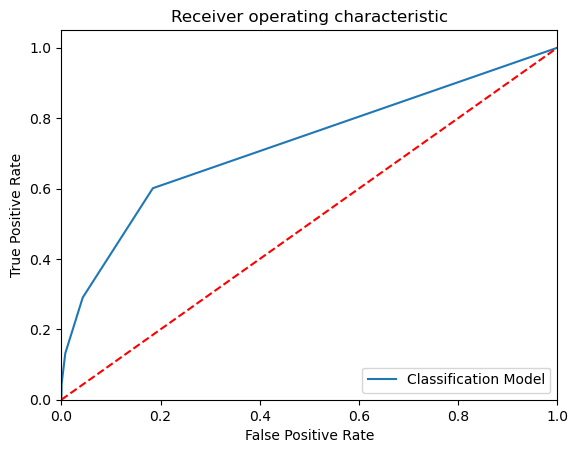

KNN_K_value =  5
Model Name: KNeighborsClassifier()
Confusion matrix : 
 [[  223  1110]
 [  217 14893]]
Outcome values : 
 223 1110 217 14893
Classification report : 
               precision    recall  f1-score   support

           1       0.51      0.17      0.25      1333
           0       0.93      0.99      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.72      0.58      0.60     16443
weighted avg       0.90      0.92      0.90     16443

Accuracy : 91.9 %
Precision : 50.7 %
Recall : 16.7 %
F1 Score : 0.252
Specificity or True Negative Rate : 98.6 %
Balanced Accuracy : 57.6 %
MCC : 0.259
roc_auc_score: 0.576


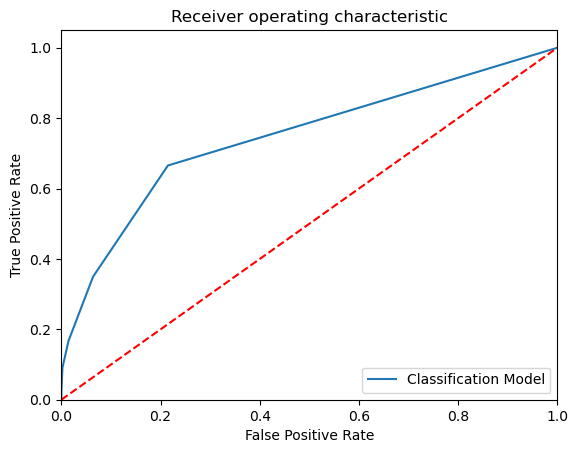

KNN_K_value =  6
Model Name: KNeighborsClassifier(n_neighbors=6)
Confusion matrix : 
 [[  156  1177]
 [   70 15040]]
Outcome values : 
 156 1177 70 15040
Classification report : 
               precision    recall  f1-score   support

           1       0.69      0.12      0.20      1333
           0       0.93      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.81      0.56      0.58     16443
weighted avg       0.91      0.92      0.90     16443

Accuracy : 92.4 %
Precision : 69.0 %
Recall : 11.7 %
F1 Score : 0.2
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 55.6 %
MCC : 0.263
roc_auc_score: 0.556


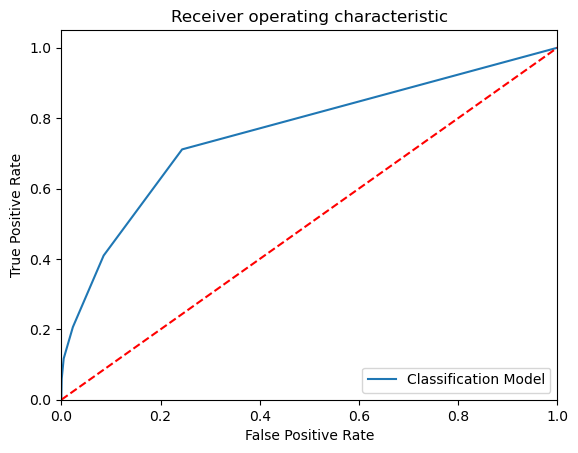

KNN_K_value =  7
Model Name: KNeighborsClassifier(n_neighbors=7)
Confusion matrix : 
 [[  193  1140]
 [  136 14974]]
Outcome values : 
 193 1140 136 14974
Classification report : 
               precision    recall  f1-score   support

           1       0.59      0.14      0.23      1333
           0       0.93      0.99      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.76      0.57      0.60     16443
weighted avg       0.90      0.92      0.90     16443

Accuracy : 92.2 %
Precision : 58.7 %
Recall : 14.5 %
F1 Score : 0.232
Specificity or True Negative Rate : 99.1 %
Balanced Accuracy : 56.8 %
MCC : 0.265
roc_auc_score: 0.568


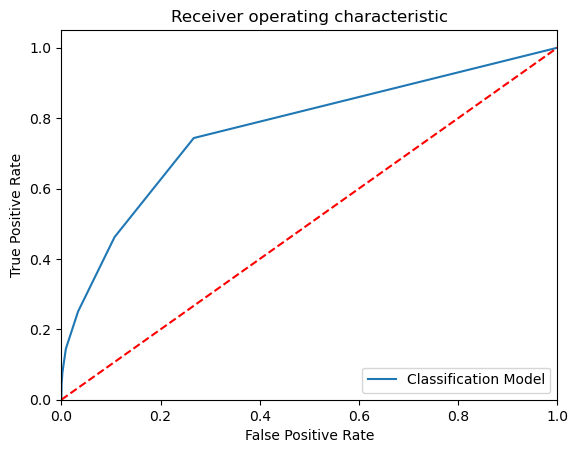

KNN_K_value =  8
Model Name: KNeighborsClassifier(n_neighbors=8)
Confusion matrix : 
 [[  139  1194]
 [   53 15057]]
Outcome values : 
 139 1194 53 15057
Classification report : 
               precision    recall  f1-score   support

           1       0.72      0.10      0.18      1333
           0       0.93      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.83      0.55      0.57     16443
weighted avg       0.91      0.92      0.90     16443

Accuracy : 92.4 %
Precision : 72.4 %
Recall : 10.4 %
F1 Score : 0.182
Specificity or True Negative Rate : 99.6 %
Balanced Accuracy : 55.0 %
MCC : 0.256
roc_auc_score: 0.55


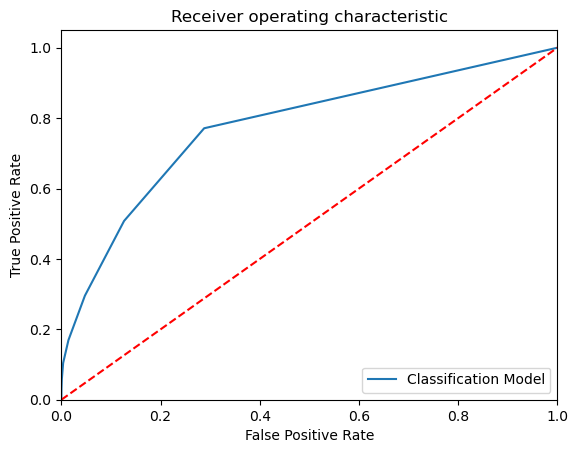

KNN_K_value =  9
Model Name: KNeighborsClassifier(n_neighbors=9)
Confusion matrix : 
 [[  169  1164]
 [   98 15012]]
Outcome values : 
 169 1164 98 15012
Classification report : 
               precision    recall  f1-score   support

           1       0.63      0.13      0.21      1333
           0       0.93      0.99      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.78      0.56      0.59     16443
weighted avg       0.90      0.92      0.90     16443

Accuracy : 92.3 %
Precision : 63.3 %
Recall : 12.7 %
F1 Score : 0.211
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 56.0 %
MCC : 0.26
roc_auc_score: 0.56


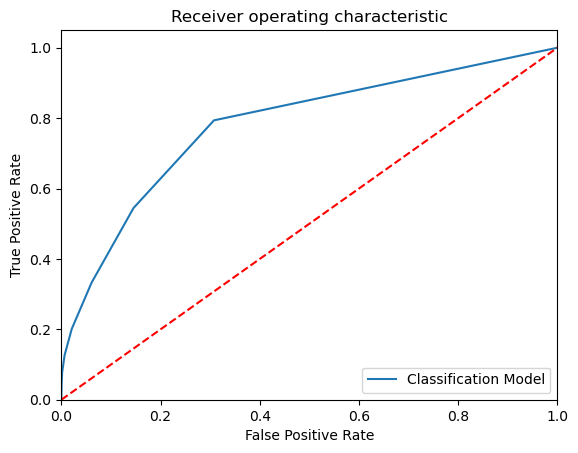

KNN_K_value =  10
Model Name: KNeighborsClassifier(n_neighbors=10)
Confusion matrix : 
 [[  126  1207]
 [   48 15062]]
Outcome values : 
 126 1207 48 15062
Classification report : 
               precision    recall  f1-score   support

           1       0.72      0.09      0.17      1333
           0       0.93      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.82      0.55      0.56     16443
weighted avg       0.91      0.92      0.90     16443

Accuracy : 92.4 %
Precision : 72.4 %
Recall : 9.5 %
F1 Score : 0.167
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 54.6 %
MCC : 0.244
roc_auc_score: 0.546


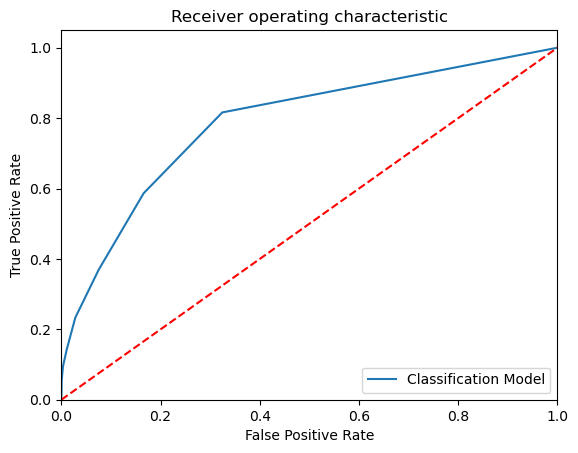

KNN_K_value =  11
Model Name: KNeighborsClassifier(n_neighbors=11)
Confusion matrix : 
 [[  146  1187]
 [   69 15041]]
Outcome values : 
 146 1187 69 15041
Classification report : 
               precision    recall  f1-score   support

           1       0.68      0.11      0.19      1333
           0       0.93      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.80      0.55      0.57     16443
weighted avg       0.91      0.92      0.90     16443

Accuracy : 92.4 %
Precision : 67.9 %
Recall : 11.0 %
F1 Score : 0.189
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 55.2 %
MCC : 0.252
roc_auc_score: 0.552


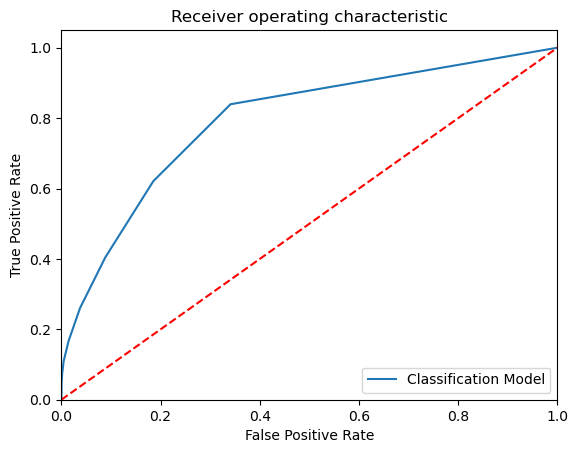

KNN_K_value =  12
Model Name: KNeighborsClassifier(n_neighbors=12)
Confusion matrix : 
 [[  119  1214]
 [   32 15078]]
Outcome values : 
 119 1214 32 15078
Classification report : 
               precision    recall  f1-score   support

           1       0.79      0.09      0.16      1333
           0       0.93      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.86      0.54      0.56     16443
weighted avg       0.91      0.92      0.90     16443

Accuracy : 92.4 %
Precision : 78.8 %
Recall : 8.9 %
F1 Score : 0.16
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 54.4 %
MCC : 0.249
roc_auc_score: 0.544


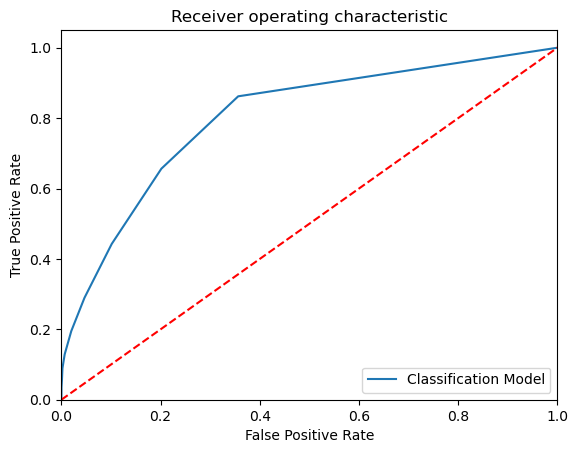

KNN_K_value =  13
Model Name: KNeighborsClassifier(n_neighbors=13)
Confusion matrix : 
 [[  139  1194]
 [   54 15056]]
Outcome values : 
 139 1194 54 15056
Classification report : 
               precision    recall  f1-score   support

           1       0.72      0.10      0.18      1333
           0       0.93      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.82      0.55      0.57     16443
weighted avg       0.91      0.92      0.90     16443

Accuracy : 92.4 %
Precision : 72.0 %
Recall : 10.4 %
F1 Score : 0.182
Specificity or True Negative Rate : 99.6 %
Balanced Accuracy : 55.0 %
MCC : 0.255
roc_auc_score: 0.55


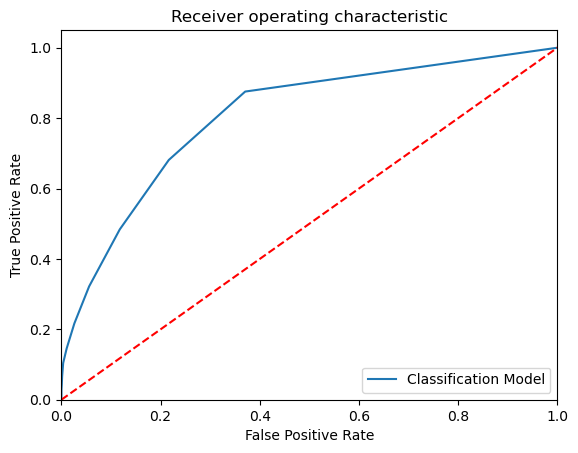

KNN_K_value =  14
Model Name: KNeighborsClassifier(n_neighbors=14)
Confusion matrix : 
 [[  106  1227]
 [   30 15080]]
Outcome values : 
 106 1227 30 15080
Classification report : 
               precision    recall  f1-score   support

           1       0.78      0.08      0.14      1333
           0       0.92      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.85      0.54      0.55     16443
weighted avg       0.91      0.92      0.89     16443

Accuracy : 92.4 %
Precision : 77.9 %
Recall : 8.0 %
F1 Score : 0.144
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 53.9 %
MCC : 0.234
roc_auc_score: 0.539


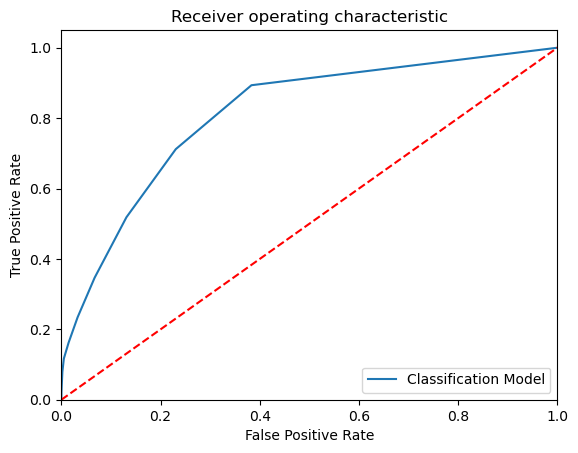

KNN_K_value =  15
Model Name: KNeighborsClassifier(n_neighbors=15)
Confusion matrix : 
 [[  120  1213]
 [   36 15074]]
Outcome values : 
 120 1213 36 15074
Classification report : 
               precision    recall  f1-score   support

           1       0.77      0.09      0.16      1333
           0       0.93      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.85      0.54      0.56     16443
weighted avg       0.91      0.92      0.90     16443

Accuracy : 92.4 %
Precision : 76.9 %
Recall : 9.0 %
F1 Score : 0.161
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 54.4 %
MCC : 0.247
roc_auc_score: 0.544


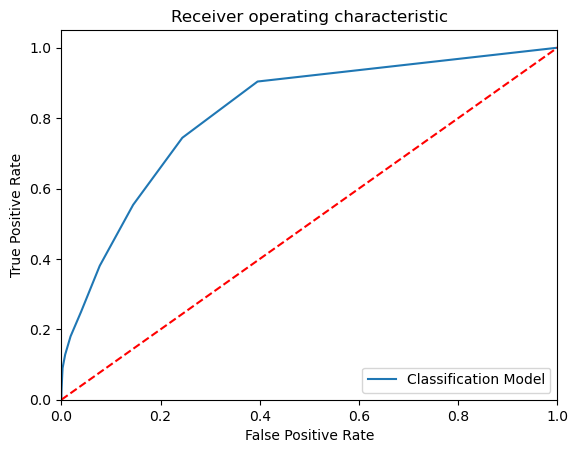

KNN_K_value =  16
Model Name: KNeighborsClassifier(n_neighbors=16)
Confusion matrix : 
 [[   99  1234]
 [   27 15083]]
Outcome values : 
 99 1234 27 15083
Classification report : 
               precision    recall  f1-score   support

           1       0.79      0.07      0.14      1333
           0       0.92      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.86      0.54      0.55     16443
weighted avg       0.91      0.92      0.89     16443

Accuracy : 92.3 %
Precision : 78.6 %
Recall : 7.4 %
F1 Score : 0.136
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 53.6 %
MCC : 0.227
roc_auc_score: 0.536


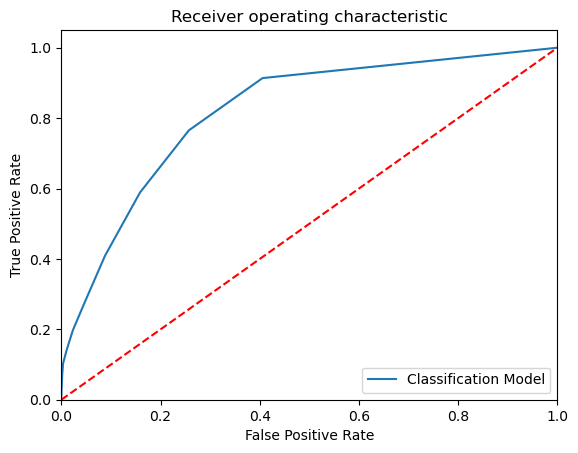

KNN_K_value =  17
Model Name: KNeighborsClassifier(n_neighbors=17)
Confusion matrix : 
 [[  107  1226]
 [   34 15076]]
Outcome values : 
 107 1226 34 15076
Classification report : 
               precision    recall  f1-score   support

           1       0.76      0.08      0.15      1333
           0       0.92      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.84      0.54      0.55     16443
weighted avg       0.91      0.92      0.89     16443

Accuracy : 92.3 %
Precision : 75.9 %
Recall : 8.0 %
F1 Score : 0.145
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 53.9 %
MCC : 0.231
roc_auc_score: 0.539


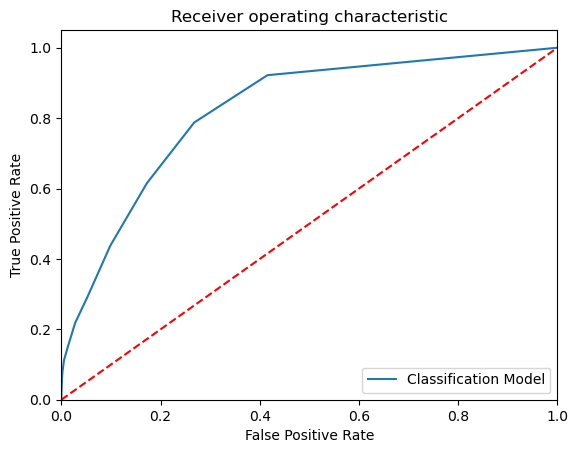

KNN_K_value =  18
Model Name: KNeighborsClassifier(n_neighbors=18)
Confusion matrix : 
 [[   86  1247]
 [   26 15084]]
Outcome values : 
 86 1247 26 15084
Classification report : 
               precision    recall  f1-score   support

           1       0.77      0.06      0.12      1333
           0       0.92      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.85      0.53      0.54     16443
weighted avg       0.91      0.92      0.89     16443

Accuracy : 92.3 %
Precision : 76.8 %
Recall : 6.5 %
F1 Score : 0.119
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 53.2 %
MCC : 0.208
roc_auc_score: 0.531


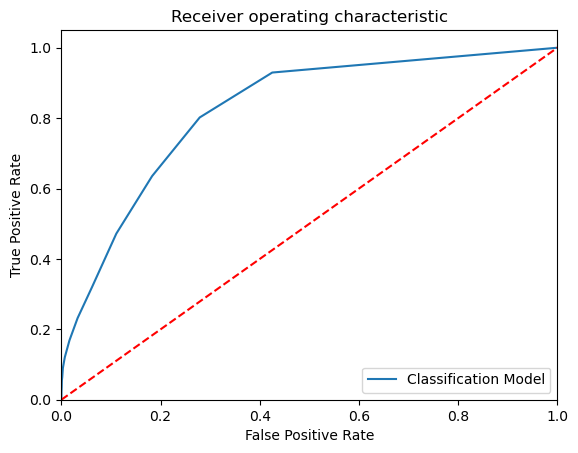

KNN_K_value =  19
Model Name: KNeighborsClassifier(n_neighbors=19)
Confusion matrix : 
 [[  103  1230]
 [   32 15078]]
Outcome values : 
 103 1230 32 15078
Classification report : 
               precision    recall  f1-score   support

           1       0.76      0.08      0.14      1333
           0       0.92      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.84      0.54      0.55     16443
weighted avg       0.91      0.92      0.89     16443

Accuracy : 92.3 %
Precision : 76.3 %
Recall : 7.7 %
F1 Score : 0.14
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 53.8 %
MCC : 0.227
roc_auc_score: 0.538


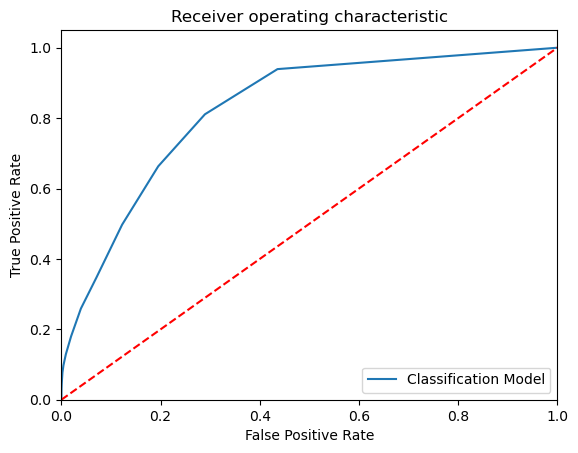

KNN_K_value =  20
Model Name: KNeighborsClassifier(n_neighbors=20)
Confusion matrix : 
 [[   89  1244]
 [   22 15088]]
Outcome values : 
 89 1244 22 15088
Classification report : 
               precision    recall  f1-score   support

           1       0.80      0.07      0.12      1333
           0       0.92      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.86      0.53      0.54     16443
weighted avg       0.91      0.92      0.89     16443

Accuracy : 92.3 %
Precision : 80.2 %
Recall : 6.7 %
F1 Score : 0.123
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 53.3 %
MCC : 0.218
roc_auc_score: 0.533


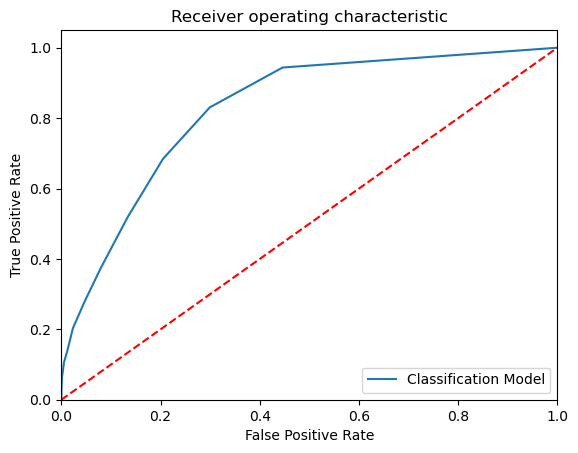

In [18]:
# Bild KNN Model

from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import sklearn.metrics as metrics

from sklearn.metrics import roc_curve, roc_auc_score

accuracy = []

for a in range(1, 21, 1):
    
    k = a
    
    # Build the model
    
    ModelKNN = KNeighborsClassifier(n_neighbors=k)
    
    # Train the model
    
    ModelKNN.fit(x_train,y_train)
    
    # Predict the model
    
    y_pred = ModelKNN.predict(x_test)
    y_pred_prob = ModelKNN.predict_proba(x_test)
    
    print('KNN_K_value = ', a)
    
    # Print the model name
    
    print('Model Name:',ModelKNN )
    
    # confusion matrix in sklearn
    
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report
    
    # actual values
    
    actual = y_test
    
    # predicted values
    
    predicted = y_pred
    
    # confusion matrix
    
    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)
    
    # outcome values order in sklearn
    
    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)
    
    # classification report for precision, recall f1-score and accuracy
    
    C_Report = classification_report(actual,predicted,labels=[1,0])
    
    print('Classification report : \n', C_Report)
    
    # calculating the metrics
    
    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);
    
    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model
    
    from math import sqrt
    
    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)
    
    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)
    
    # Area under ROC curve 
    
    from sklearn.metrics import roc_curve, roc_auc_score
    
    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, ModelKNN.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    #plt.savefig('Log_ROC')
    plt.show()
    #------------------------------------------------------------------------------
    new_row = {'Model Name' : ModelKNN,
               'KNN K Value' : a,
               'True_Positive' : tp,
               'False_Negative' : fn,
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    KNN_Results = KNN_Results.append(new_row, ignore_index=True)
    #------KNN_Results------------------------------------------------------------------------

In [19]:
#displaying the KNNresults data

KNN_Results

,Model Name,KNN K Value,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,KNeighborsClassifier(n_neighbors=1),1,404,929,923,14187,0.887,0.304,0.303,0.304,0.939,0.242,0.620995,0.621
1,KNeighborsClassifier(n_neighbors=2),2,189,1144,147,14963,0.921,0.562,0.142,0.226,0.990,0.255,0.566028,0.566
2,KNeighborsClassifier(n_neighbors=3),3,298,1035,376,14734,0.914,0.442,0.224,0.297,0.975,0.273,0.599336,0.600
3,KNeighborsClassifier(n_neighbors=4),4,176,1157,119,14991,0.922,0.597,0.132,0.216,0.992,0.255,0.562079,0.562
4,KNeighborsClassifier(),5,223,1110,217,14893,0.919,0.507,0.167,0.252,0.986,0.259,0.576465,0.576
5,KNeighborsClassifier(n_neighbors=6),6,156,1177,70,15040,0.924,0.690,0.117,0.200,0.995,0.263,0.556198,0.556
6,KNeighborsClassifier(n_neighbors=7),7,193,1140,136,14974,0.922,0.587,0.145,0.232,0.991,0.265,0.567893,0.568
7,KNeighborsClassifier(n_neighbors=8),8,139,1194,53,15057,0.924,0.724,0.104,0.182,0.996,0.256,0.550384,0.550
8,KNeighborsClassifier(n_neighbors=9),9,169,1164,98,15012,0.923,0.633,0.127,0.211,0.994,0.260,0.560148,0.560
9,KNeighborsClassifier(n_neighbors=10),10,126,1207,48,15062,0.924,0.724,0.095,0.167,0.997,0.244,0.545673,0.546


In [20]:
#reading the required csv file

EMResults=pd.read_csv(r"C:\Users\Dlc\Downloads\Dataset and Results File\EMResults.csv",header=0)

Model Name:  LogisticRegression()
Confusion matrix : 
 [[   88  1245]
 [   54 15056]]
Outcome values : 
 88 1245 54 15056
Classification report : 
               precision    recall  f1-score   support

           1       0.62      0.07      0.12      1333
           0       0.92      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.77      0.53      0.54     16443
weighted avg       0.90      0.92      0.89     16443

Accuracy : 92.1 %
Precision : 62.0 %
Recall : 6.6 %
F1 Score : 0.119
Specificity or True Negative Rate : 99.6 %
Balanced Accuracy : 53.1 %
MCC : 0.184
roc_auc_score: 0.531


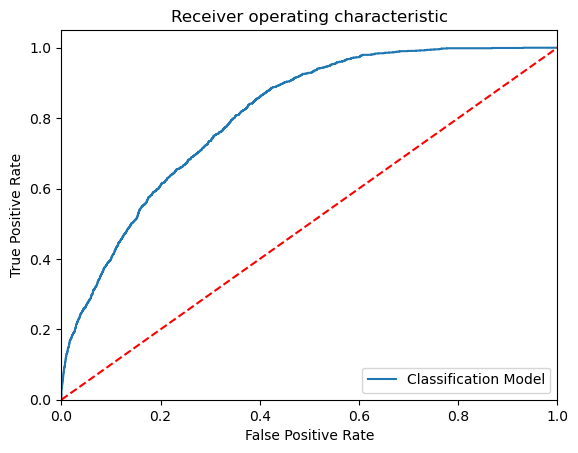

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[  601   732]
 [ 1017 14093]]
Outcome values : 
 601 732 1017 14093
Classification report : 
               precision    recall  f1-score   support

           1       0.37      0.45      0.41      1333
           0       0.95      0.93      0.94     15110

    accuracy                           0.89     16443
   macro avg       0.66      0.69      0.67     16443
weighted avg       0.90      0.89      0.90     16443

Accuracy : 89.4 %
Precision : 37.1 %
Recall : 45.1 %
F1 Score : 0.407
Specificity or True Negative Rate : 93.3 %
Balanced Accuracy : 69.2 %
MCC : 0.351
roc_auc_score: 0.692


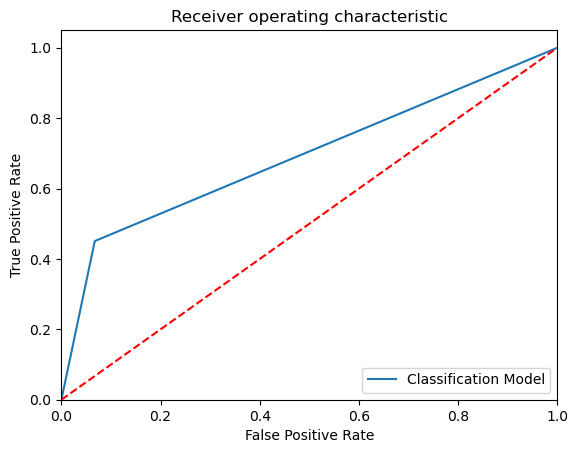

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[  379   954]
 [   88 15022]]
Outcome values : 
 379 954 88 15022
Classification report : 
               precision    recall  f1-score   support

           1       0.81      0.28      0.42      1333
           0       0.94      0.99      0.97     15110

    accuracy                           0.94     16443
   macro avg       0.88      0.64      0.69     16443
weighted avg       0.93      0.94      0.92     16443

Accuracy : 93.7 %
Precision : 81.2 %
Recall : 28.4 %
F1 Score : 0.421
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 63.9 %
MCC : 0.458
roc_auc_score: 0.639


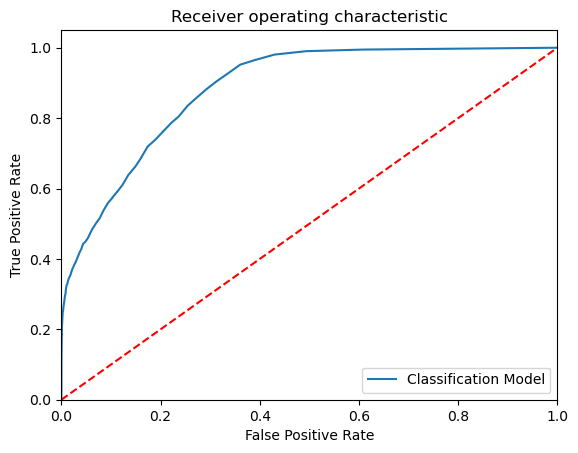

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[  351   982]
 [  160 14950]]
Outcome values : 
 351 982 160 14950
Classification report : 
               precision    recall  f1-score   support

           1       0.69      0.26      0.38      1333
           0       0.94      0.99      0.96     15110

    accuracy                           0.93     16443
   macro avg       0.81      0.63      0.67     16443
weighted avg       0.92      0.93      0.92     16443

Accuracy : 93.1 %
Precision : 68.7 %
Recall : 26.3 %
F1 Score : 0.381
Specificity or True Negative Rate : 98.9 %
Balanced Accuracy : 62.6 %
MCC : 0.398
roc_auc_score: 0.626


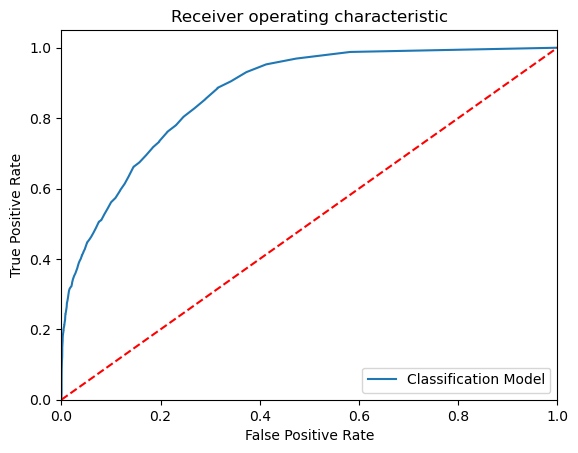

-----------------------------------------------------------------------------------------------------
Model Name:  KNeighborsClassifier(n_neighbors=6)
Confusion matrix : 
 [[  156  1177]
 [   70 15040]]
Outcome values : 
 156 1177 70 15040
Classification report : 
               precision    recall  f1-score   support

           1       0.69      0.12      0.20      1333
           0       0.93      1.00      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.81      0.56      0.58     16443
weighted avg       0.91      0.92      0.90     16443

Accuracy : 92.4 %
Precision : 69.0 %
Recall : 11.7 %
F1 Score : 0.2
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 55.6 %
MCC : 0.263
roc_auc_score: 0.556


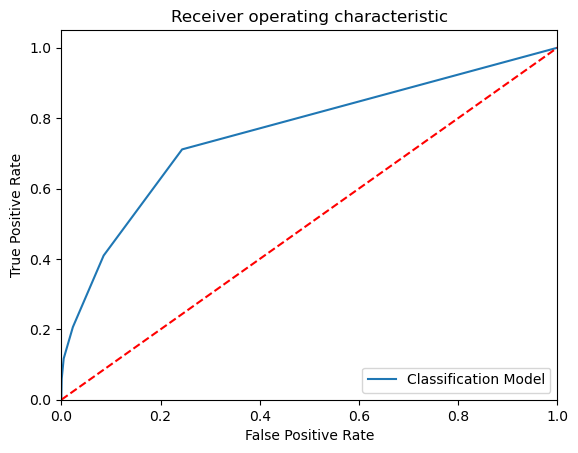

-----------------------------------------------------------------------------------------------------
Model Name:  SVC(class_weight='balanced', probability=True, random_state=42)
Confusion matrix : 
 [[1178  155]
 [5254 9856]]
Outcome values : 
 1178 155 5254 9856
Classification report : 
               precision    recall  f1-score   support

           1       0.18      0.88      0.30      1333
           0       0.98      0.65      0.78     15110

    accuracy                           0.67     16443
   macro avg       0.58      0.77      0.54     16443
weighted avg       0.92      0.67      0.75     16443

Accuracy : 67.1 %
Precision : 18.3 %
Recall : 88.4 %
F1 Score : 0.303
Specificity or True Negative Rate : 65.2 %
Balanced Accuracy : 76.8 %
MCC : 0.3
roc_auc_score: 0.768


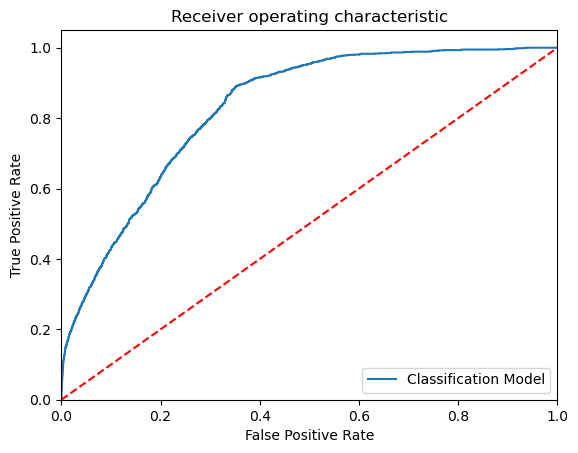

-----------------------------------------------------------------------------------------------------
Model Name:  GaussianNB()
Confusion matrix : 
 [[  161  1172]
 [  217 14893]]
Outcome values : 
 161 1172 217 14893
Classification report : 
               precision    recall  f1-score   support

           1       0.43      0.12      0.19      1333
           0       0.93      0.99      0.96     15110

    accuracy                           0.92     16443
   macro avg       0.68      0.55      0.57     16443
weighted avg       0.89      0.92      0.89     16443

Accuracy : 91.6 %
Precision : 42.6 %
Recall : 12.1 %
F1 Score : 0.188
Specificity or True Negative Rate : 98.6 %
Balanced Accuracy : 55.4 %
MCC : 0.194
roc_auc_score: 0.553


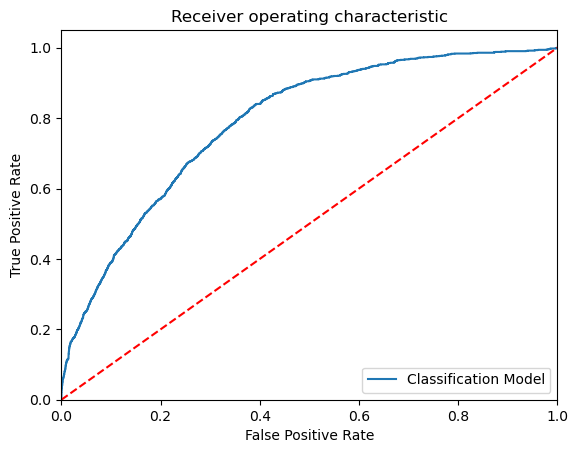

-----------------------------------------------------------------------------------------------------


In [21]:
# Build the Calssification models and compare the results

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

# Create objects of classification algorithm with default hyper-parameters

ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
ModelKNN = KNeighborsClassifier(n_neighbors=6)
ModelSVM = SVC(kernel='rbf', random_state = 42, class_weight='balanced', probability=True)
ModelGNB = GaussianNB()

# Evalution matrix for all the algorithms

MM = [ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelSVM, ModelGNB]
for models in MM:
    
    # Fit the model
    
    models.fit(x_train, y_train)
    
    # Prediction
    
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)
    
    # Print the model name
    
    print('Model Name: ', models)
    
    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])

    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve 

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    logit_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #----------------------------------------------------------------------------------------------------------
    new_row = {'Model Name' : models,
               'True_Positive' : tp, 
               'False_Negative' : fn, 
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    EMResults = EMResults.append(new_row, ignore_index=True)
    #----------------------------------------------------------------------------------------------------------

In [22]:
#displaying the EMResults data

EMResults

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,LogisticRegression(),88,1245,54,15056,0.921,0.620,0.066,0.119,0.996,0.184,0.531221,0.531
1,DecisionTreeClassifier(),601,732,1017,14093,0.894,0.371,0.451,0.407,0.933,0.351,0.691778,0.692
2,"(DecisionTreeClassifier(max_features='sqrt', r...",379,954,88,15022,0.937,0.812,0.284,0.421,0.994,0.458,0.639249,0.639
3,"(ExtraTreeClassifier(random_state=1842200658),...",351,982,160,14950,0.931,0.687,0.263,0.381,0.989,0.398,0.626363,0.626
4,KNeighborsClassifier(n_neighbors=6),156,1177,70,15040,0.924,0.690,0.117,0.200,0.995,0.263,0.556198,0.556
5,"SVC(class_weight='balanced', probability=True,...",1178,155,5254,9856,0.671,0.183,0.884,0.303,0.652,0.300,0.768002,0.768
6,GaussianNB(),161,1172,217,14893,0.916,0.426,0.121,0.188,0.986,0.194,0.553209,0.554


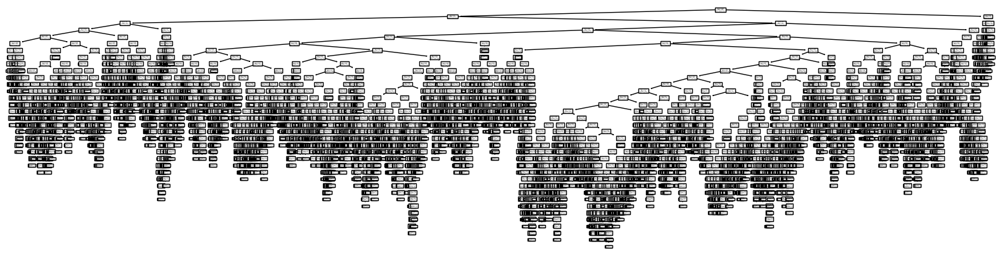

In [23]:
import matplotlib.pyplot as plt
from sklearn import tree
plt.figure(figsize=(20,5))
tree.plot_tree(ModelDC);

In [24]:
# Create a list for plotting the decision trees

figcols = ['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted']

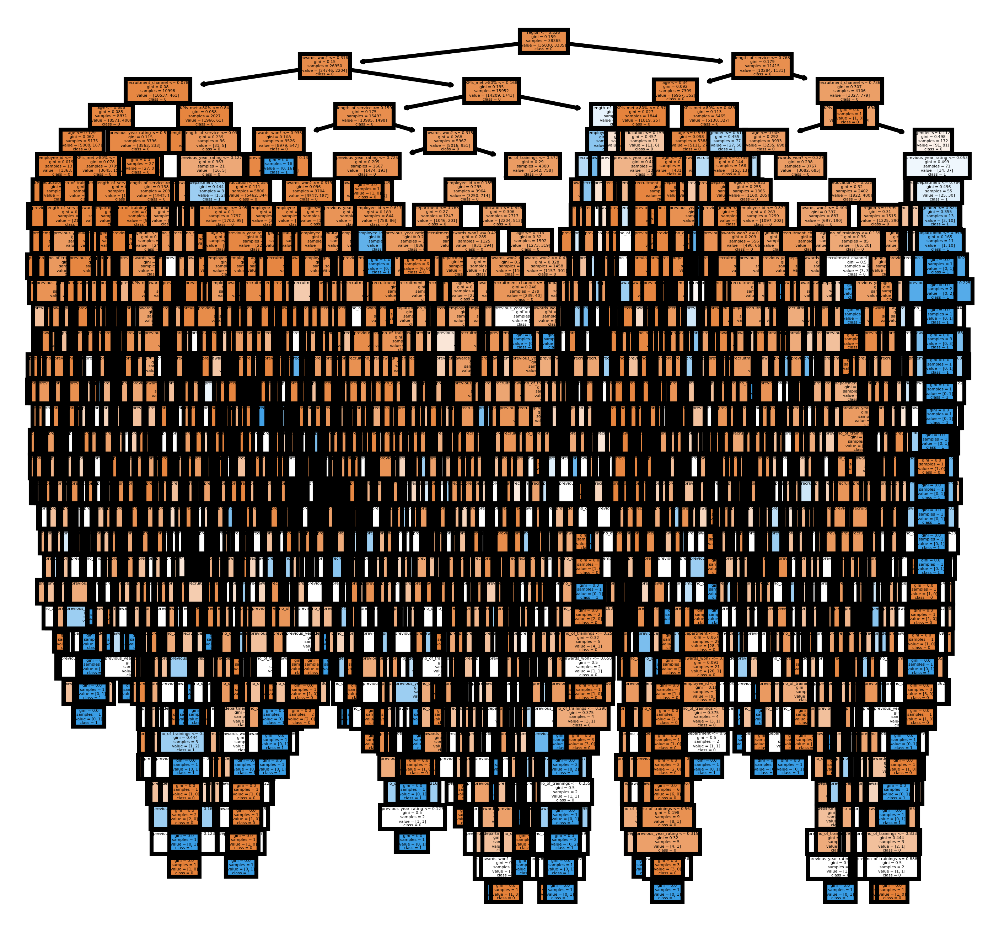

In [25]:
# Visualize individual trees and code below visualizes the first decision tree of Extra Trees Classifier 

from sklearn import tree 

fn1=figcols 
cn1=['0', '1'] 
 
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800) 
tree.plot_tree(ModelET.estimators_[0], 
               feature_names = fn1, 
               class_names=cn1, 
               filled = True); 
#fig.savefig('ModelET.png') 

In [26]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Extra Trees Classifier

from sklearn import tree

fn2=figcols
cn2=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(ModelET.estimators_[index],
                   feature_names = fn2, 
                   class_names=cn2,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
#fig.savefig('ModelET1.png')

In [27]:
# Predict the values KNN algorithm

y_predDC = ModelDC.predict(x_test)

In [28]:
Results = pd.DataFrame({'is_promoted_A':y_test, 'is_promoted_P':y_predDC})

# Merge two Dataframes on index of both the dataframes

ResultsFinal = HRdata.merge(Results, left_index=True, right_index=True)
ResultsFinal.sample(10)

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,is_promoted_A,is_promoted_P
11575,7,31,2,1,0,1,32,3.0,6,0,0,50,0,0,0
54765,7,11,0,1,0,2,33,1.0,3,0,0,48,0,0,0
29169,4,18,0,1,0,1,31,5.0,3,1,0,63,0,0,0
36100,8,10,0,1,0,1,44,1.0,11,0,0,78,0,0,0
26670,5,6,2,1,2,1,34,3.0,4,1,0,66,0,0,0
47865,5,18,0,1,0,5,30,3.0,2,0,0,70,0,0,0
7308,7,14,0,1,0,1,29,2.0,6,0,0,50,0,0,0
5562,5,31,0,1,0,1,31,5.0,3,1,0,72,0,0,0
50510,5,11,0,0,0,2,28,3.0,2,0,0,71,0,0,0
15083,4,10,0,1,2,2,44,4.0,10,1,0,59,0,0,0


In [29]:
HRdata.shape

(54808, 13)